**Léa ZADIKIAN - Décembre 2022**
# Projet n° 5 : Segmentez des clients d'un site e-commerce
## Notebook n°2 / 3 : essais des différentes approches de modélisation

Données et définition des variables : https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce

## Sommaire :
<a href="#C1">1. Import des librairies</a>

<a href="#C2">2. Modèle K-Means </a>

    - K-Means sur les features RFM
    - K-Means sur les features RFM + Review Score

<a href="#C3">3. Modèle DBSCAN</a>

    - Simulation avec min_sample = 100
    - Simulation avec min_sample = 10
    



# <a name="C1">1. Import des librairies</a>

In [78]:
! pip install yellowbrick
import pandas as pd
import numpy as np
from pandas.plotting import scatter_matrix
import missingno as msno
from datetime import timedelta


import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from mpl_toolkits.mplot3d import axes3d  # Fonction pour la 3D

from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

from sklearn import metrics

from sklearn.decomposition import PCA

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer,InterclusterDistance



Defaulting to user installation because normal site-packages is not writeable


# <a name="C2">2. Modèle K-Means</a>
## Test du KMeans sur les 3 features RFM

In [2]:
#Lecture et affichage du fichier 'olist_model_1', premier modèle avec les 3 features RFM
rfm=pd.read_csv('olist_model_1.csv')
rfm

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89
...,...,...,...,...
93353,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42
93354,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58
93355,ffff371b4d645b6ecea244b27531430a,568,1,112.46
93356,ffff5962728ec6157033ef9805bacc48,119,1,133.69


In [3]:
rfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93358 entries, 0 to 93357
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  93358 non-null  object 
 1   Recency             93358 non-null  int64  
 2   Frequency           93358 non-null  int64  
 3   Monetary            93358 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 2.8+ MB


In [4]:
rfm.describe()

,Recency,Frequency,Monetary
count,93358.000000,93358.000000,93358.000000
mean,237.941773,1.033420,165.197003
std,152.591453,0.209097,226.314012
min,1.000000,1.000000,0.000000
25%,114.000000,1.000000,63.052500
50%,219.000000,1.000000,107.780000
75%,346.000000,1.000000,182.557500
max,714.000000,15.000000,13664.080000


In [5]:
# Vérification du montant total de commande --> OK
rfm['Monetary'].sum()

15422461.769999998

### Séparation des données

In [6]:
# Création de la matrice contenant uniquement les features RFM (supression de l'id client)
X = rfm.drop(columns='customer_unique_id')
X

,Recency,Frequency,Monetary
0,112,1,141.90
1,115,1,27.19
2,537,1,86.22
3,321,1,43.62
4,288,1,196.89
...,...,...,...
93353,447,1,2067.42
93354,262,1,84.58
93355,568,1,112.46
93356,119,1,133.69


### Standardisation des données

In [7]:
std_scaler = preprocessing.StandardScaler()
X_scaled=std_scaler.fit_transform(X)

### Recherche du nombre k de clusters optimal pour la segmentation
Mise en oeuvre de 2 outils complémentaires : Elbow method et coefficient de silhouettte

In [8]:
interties = [] # liste vide pour sotcker les inerties
silhouettes= [] # liste vide pour sotcker les coefficients de silhouettes

# Pour chaque valeur de k allant de 2 à 10, on entraine un k-means et on stocke inertie et coefficient de silhouette
k_list=range(2,11)
for k in k_list :
    kmeans = KMeans(n_clusters=k) # initialisé par defaut avec 'k-means++’
    kmeans.fit(X_scaled) 
    interties.append(kmeans.inertia_) # Attribut Inertie : Sum of squared distances of samples to their closest cluster center
    silhouettes.append(metrics.silhouette_score(X_scaled,kmeans.labels_)) # Coefficient de silhouette


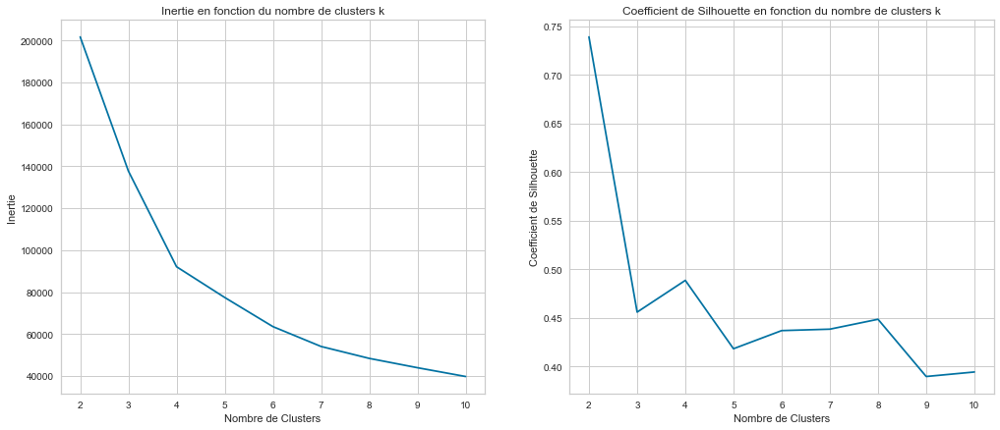

In [9]:
# Représentation graphique de l'inertie et du coefficient de silhouette en fonction du nombre de clusters k
fig=plt.figure(figsize = (17,7))

# Inertie en fonction du nombre de clusters K, pour k variant de 2 à 10
ax = fig.add_subplot(1,2, 1)
ax.set_ylabel("Inertie")
ax.set_xlabel("Nombre de Clusters")
plt.title("Inertie en fonction du nombre de clusters k")
ax = plt.plot(k_list, interties)

# Coefficients de silhouette en fonction du nombre de clusters K, pour k variant de 2 à 10
ax = fig.add_subplot(1,2,2)
ax.set_ylabel("Coefficient de Silhouette")
ax.set_xlabel("Nombre de Clusters")
plt.title("Coefficient de Silhouette en fonction du nombre de clusters k")
ax = plt.plot(k_list, silhouettes)

### Test de la librairie Yellowbrick
The Yellowbrick library is a diagnostic visualization platform for machine learning.
Nous cherchons à retrouver les graphiques précédemment tracés "à la main", à l'aide de la librairie Yellowbrick.

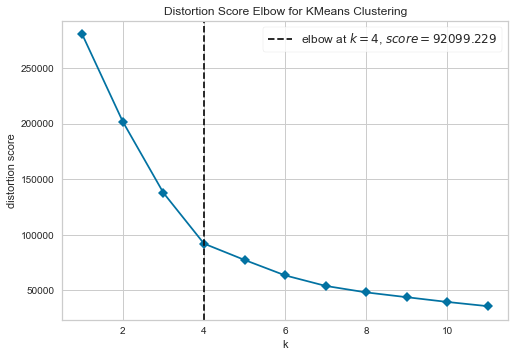

In [10]:
# Recherhe du nombre de clusters K optimal par la méthode du coude (Elbow Method)
# Instantiation du k-means et du visualizer
Kmeans_model = KMeans()
visualizer = KElbowVisualizer(Kmeans_model, k=(1,12),timings=False)
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();

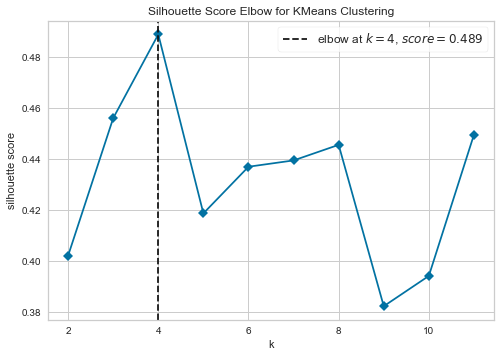

In [11]:
# Recherhe du K optimum par la méthode du coefficient de silhouette
# Instantiation du k-means et du visualizer
Kmeans_model = KMeans()
visualizer = KElbowVisualizer(Kmeans_model, k=(2,12),timings=False,metric='silhouette')
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();  

Le fonction KElbowVisualizer de la librairie Yellowbrick nous a permis de retrouver les graph obtenus précédement.

### Coefficient silhouette des clusters pour différentes valeurs de k

**Définition du coefficient de Sihouette**

Silhouette analysis can be used to evaluate the density and separation between clusters. The score is calculated by averaging the silhouette coefficient for each sample, which is computed as the difference between the average intra-cluster distance and the mean nearest-cluster distance for each sample, normalized by the maximum value. This produces a score between -1 and +1, where scores near +1 indicate high separation and scores near -1 indicate that the samples may have been assigned to the wrong cluster.
In addition, the vertical red-dotted line on the plot indicates the average silhouette score for all observations.
In SilhouetteVisualizer plots, clusters with higher scores have wider silhouettes, but clusters that are less cohesive will fall short of the average score across all clusters, which is plotted as a vertical dotted red line.

In [12]:
# On ré entraine avec K=2
kmeans_2 = KMeans(n_clusters=2)
kmeans_2.fit(X_scaled)

KMeans(n_clusters=2)

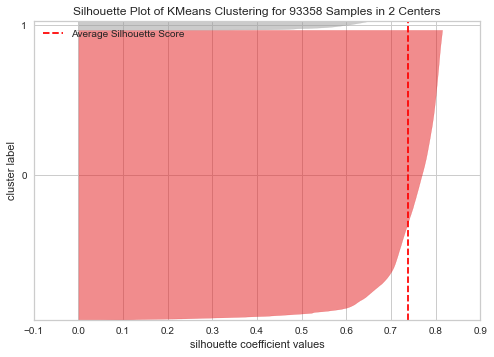

In [13]:
# Instanciation du visualizer 
visualizer = SilhouetteVisualizer(kmeans_2)
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();    # Draw/show/poof the data

In [14]:
# On ré entraine avec K=3
kmeans_3 = KMeans(n_clusters=3)
kmeans_3.fit(X_scaled)

KMeans(n_clusters=3)

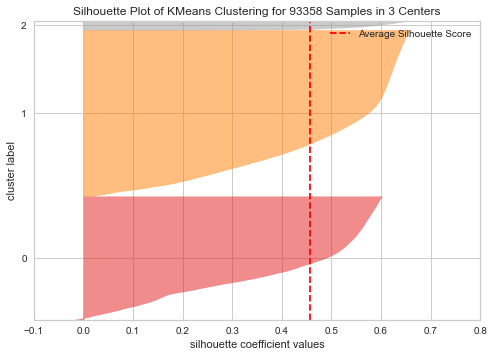

In [15]:
# Instanciation du visualizer 
visualizer = SilhouetteVisualizer(kmeans_3)
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();    # Draw/show/poof the data

In [79]:
# On ré entraine avec K=4
kmeans_4 = KMeans(n_clusters=4)
kmeans_4.fit(X_scaled)

KMeans(n_clusters=4)

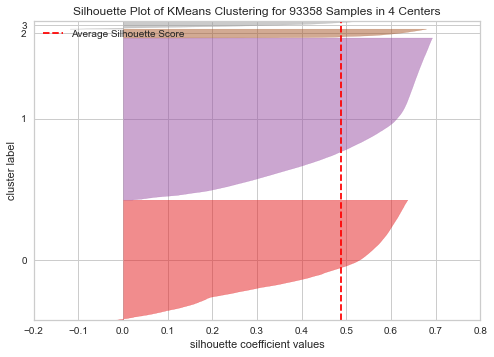

In [17]:
# Instanciation du visualizer 
visualizer = SilhouetteVisualizer(kmeans_4)
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();    # Draw/show/poof the data

In [80]:
# On ré entraine avec K=5
kmeans_5 = KMeans(n_clusters=5)
kmeans_5.fit(X_scaled)

KMeans(n_clusters=5)

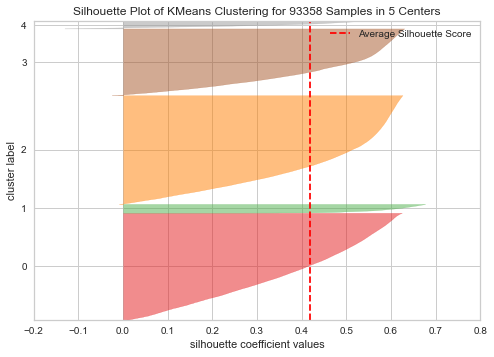

In [19]:
# Instanciation du visualizer 
visualizer = SilhouetteVisualizer(kmeans_5)
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();    # Draw/show/poof the data

### Intercluster distance map

Intercluster distance maps display an embedding of the cluster centers in 2 dimensions with the distance to other centers preserved. E.g. the closer to centers are in the visualization, the closer they are in the original feature space. The clusters are sized according to a scoring metric. By default, they are sized by membership, e.g. the number of instances that belong to each center. This gives a sense of the relative importance of clusters. Note however, that because two clusters overlap in the 2D space, it does not imply that they overlap in the original feature space.

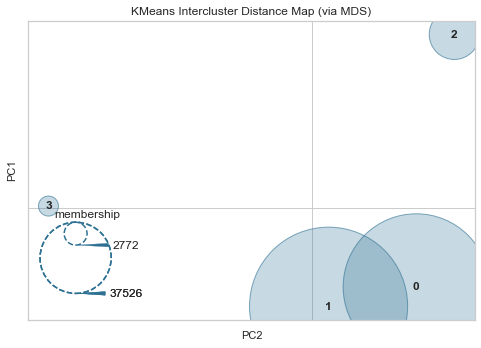

In [20]:
# Instantiate the clustering model and visualizer
visualizer = InterclusterDistance(kmeans_4)
visualizer.fit(X_scaled)        # Fit the data to the visualizer
visualizer.show();        # Finalize and render the figure

### Analyse des clusters avec un nombre de clusters k = 4

In [21]:
# On crée une colonne comportant le label du cluster associé à chaque point( chaque client)
rfm['Cluster'] = kmeans_4.labels_
rfm

,customer_unique_id,Recency,Frequency,Monetary,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,1
2,0000f46a3911fa3c0805444483337064,537,1,86.22,0
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,0
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,0
...,...,...,...,...,...
93353,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,3
93354,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,0
93355,ffff371b4d645b6ecea244b27531430a,568,1,112.46,0
93356,ffff5962728ec6157033ef9805bacc48,119,1,133.69,1


In [22]:
# Libellés des clusters
rfm['Cluster'].unique()

array([1, 0, 2, 3])

In [23]:
rfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93358 entries, 0 to 93357
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  93358 non-null  object 
 1   Recency             93358 non-null  int64  
 2   Frequency           93358 non-null  int64  
 3   Monetary            93358 non-null  float64
 4   Cluster             93358 non-null  int32  
dtypes: float64(1), int32(1), int64(2), object(1)
memory usage: 3.2+ MB


In [24]:
# Pour une meilleure lisibilité, on remplace par des lettres les labels des clusters qui sont par défaut des chiffres.
rfm['Cluster']=rfm['Cluster'].replace(0,'A')
rfm['Cluster']=rfm['Cluster'].replace(1,'B')
rfm['Cluster']=rfm['Cluster'].replace(2,'C')
rfm['Cluster']=rfm['Cluster'].replace(3,'D')

# Nombre de clients par clusters
rfm['Cluster'].value_counts(normalize=False).sort_values(ascending=False)

B    50644
A    37526
C     2772
D     2416
Name: Cluster, dtype: int64

In [81]:
# Représentation 3D des différents clusters de clients selon les 3 axes d'analyse RFM
import plotly.express as px
fig = px.scatter_3d(rfm, x='Recency', y='Frequency', z='Monetary',color='Cluster')
fig.show()

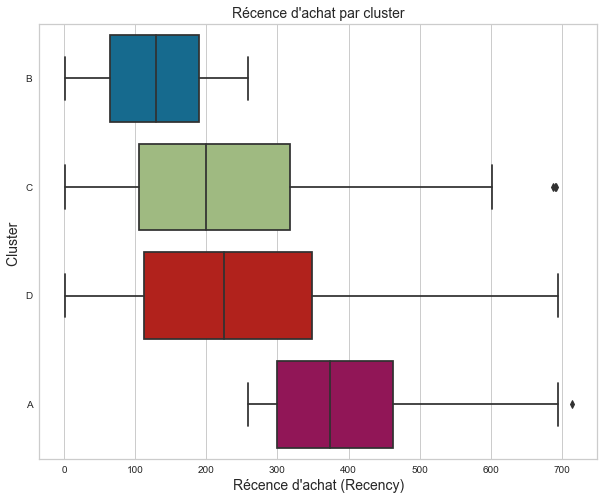

In [26]:
# Boxplot de la Récence par cluster
ordre_cluster = rfm.groupby('Cluster')['Recency'].median().sort_values().index
plt.figure(figsize=(10,8))
plt.title("Récence d'achat par cluster", fontsize=14)
sns.boxplot(x=rfm['Recency'], 
            y=rfm['Cluster'], 
            showfliers=True,
            orient='h', 
            order=ordre_cluster,
            data=rfm)
plt.xlabel("Récence d'achat (Recency)",fontsize=14)
plt.ylabel('Cluster ',fontsize=14)
plt.show()

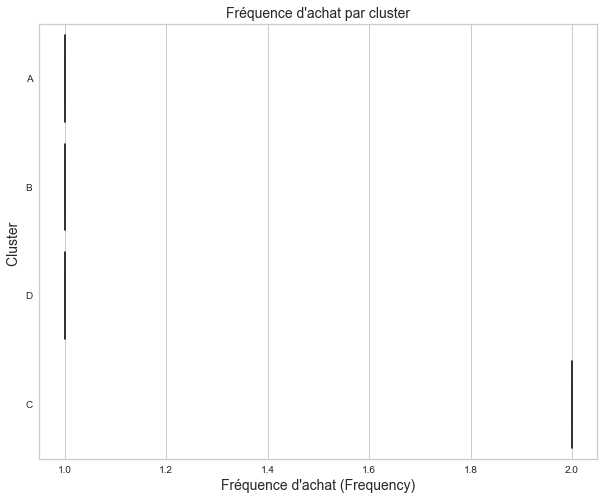

In [27]:
# Boxplot de la Fréquence par cluster
ordre_cluster = rfm.groupby('Cluster')['Frequency'].median().sort_values().index
plt.figure(figsize=(10,8))
plt.title("Fréquence d'achat par cluster", fontsize=14)
sns.boxplot(x=rfm['Frequency'], 
            y=rfm['Cluster'], 
            showfliers=False,
            orient='h', 
            order=ordre_cluster,
            data=rfm)
plt.xlabel("Fréquence d'achat (Frequency)",fontsize=14)
plt.ylabel('Cluster ',fontsize=14)
plt.show()

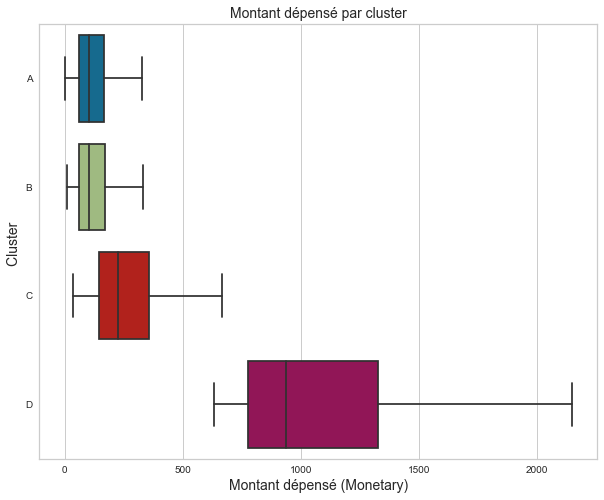

In [28]:
# Boxplot du Montant dépensé par cluster

ordre_cluster = rfm.groupby('Cluster')['Monetary'].median().sort_values().index
plt.figure(figsize=(10,8))
plt.title("Montant dépensé par cluster", fontsize=14)
sns.boxplot(x=rfm['Monetary'], 
            y=rfm['Cluster'], 
            showfliers=False,
            orient='h', 
            order=ordre_cluster,
            data=rfm)
plt.xlabel('Montant dépensé (Monetary)',fontsize=14)
plt.ylabel('Cluster ',fontsize=14)
plt.show()

## Features RFM + Review Score (2 ème iteration)

In [29]:
#Lecture et affichage du fichier 'olist_model_2'
rfm_rs=pd.read_csv('olist_model_2.csv')
rfm_rs

,customer_unique_id,Recency,Frequency,Monetary,Review Score
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,5.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4.0
2,0000f46a3911fa3c0805444483337064,537,1,86.22,3.0
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,4.0
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,5.0
...,...,...,...,...,...
92588,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,5.0
92589,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,4.0
92590,ffff371b4d645b6ecea244b27531430a,568,1,112.46,5.0
92591,ffff5962728ec6157033ef9805bacc48,119,1,133.69,5.0


### Sépartion et standardisation des données

In [30]:
X = rfm_rs.drop(columns='customer_unique_id')
std_scale = preprocessing.StandardScaler()
X_scaled=std_scale.fit_transform(X)

### Rechecrhe du nombre optimal de clusters k

In [31]:
interties = [] # liste vide pour sotcker les inerties
silhouettes= [] # liste vide pour sotcker les coefficients de silhouettes

# Pour chaque valeur de k allant de 2 à 10, on entraîne un k-means et on stocke inertie et coefficient de silhouette
k_list=range(2,10)
for k in k_list :
    kmeans = KMeans(n_clusters=k) # default init=’k-means++’
    kmeans.fit(X_scaled) 
    interties.append(kmeans.inertia_) # Attibut Inertie : Sum of squared distances of samples to their closest cluster center
    silhouettes.append(metrics.silhouette_score(X_scaled,kmeans.labels_)) # Coefficient de silhouette

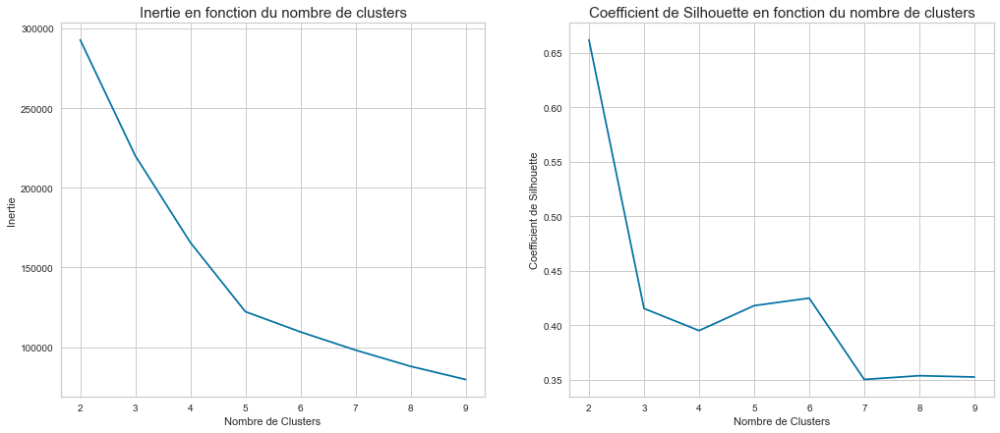

In [32]:
fig=plt.figure(figsize = (17,7))

# Inertie en fonction du nombre de clusters K, pour k variant de 2 à 10
ax = fig.add_subplot(1,2, 1)
ax.set_ylabel("Inertie")
ax.set_xlabel("Nombre de Clusters")
plt.title("Inertie en fonction du nombre de clusters", fontsize=15)
ax = plt.plot(k_list, interties)

# Coefficients de silhouette en fonction du nombre de clusters K, pour k variant de 2 à 10
ax = fig.add_subplot(1,2,2)
ax.set_ylabel("Coefficient de Silhouette")
ax.set_xlabel("Nombre de Clusters")
plt.title("Coefficient de Silhouette en fonction du nombre de clusters", fontsize=15)
ax = plt.plot(k_list, silhouettes)

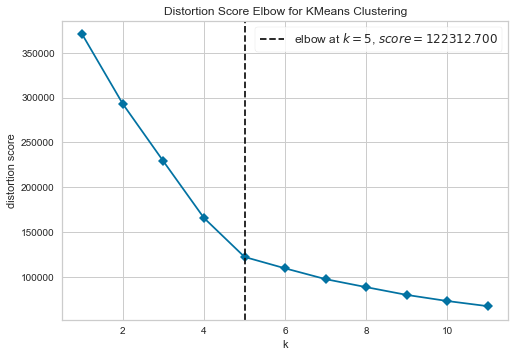

In [33]:
# Recherhe du nombre de clusters K optimal par la méthode du coude (Elbow Method)
# Instantiation du k-means et du visualizer
Kmeans_model = KMeans()
visualizer = KElbowVisualizer(Kmeans_model, k=(1,12),timings=False)
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();

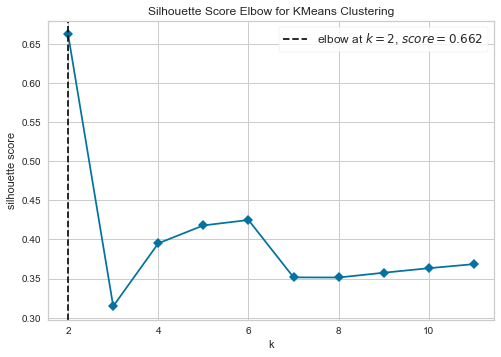

In [34]:
# Recherhe du K optimum par la méthode du coefficient de silhouette
# Instantiation du k-means et du visualizer
Kmeans_model = KMeans()
visualizer = KElbowVisualizer(Kmeans_model, k=(2,12),timings=False,metric='silhouette')
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();  

### Coefficients silouette pour différentes valeurs de k

In [35]:
# On ré entraine avec K=2
kmeans_2 = KMeans(n_clusters=2)
kmeans_2.fit(X_scaled)
rfm_rs['Cluster'] = kmeans_2.labels_ #Label du cluster associé à chaque point
rfm_rs

,customer_unique_id,Recency,Frequency,Monetary,Review Score,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,5.0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4.0,0
2,0000f46a3911fa3c0805444483337064,537,1,86.22,3.0,0
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,4.0,0
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,5.0,0
...,...,...,...,...,...,...
92588,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,5.0,0
92589,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,4.0,0
92590,ffff371b4d645b6ecea244b27531430a,568,1,112.46,5.0,0
92591,ffff5962728ec6157033ef9805bacc48,119,1,133.69,5.0,0


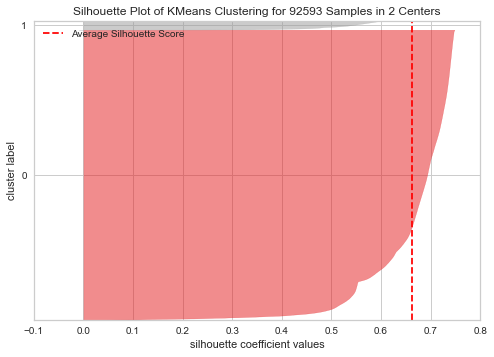

In [36]:
# Instanciation du visualizer 
visualizer = SilhouetteVisualizer(kmeans_2)
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();

In [37]:
# On ré entraîne avec K=3
kmeans_3 = KMeans(n_clusters=3)
kmeans_3.fit(X_scaled)
rfm_rs['Cluster'] = kmeans_3.labels_ #Label du cluster associé à chaque point
rfm_rs

,customer_unique_id,Recency,Frequency,Monetary,Review Score,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,5.0,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4.0,1
2,0000f46a3911fa3c0805444483337064,537,1,86.22,3.0,0
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,4.0,1
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,5.0,1
...,...,...,...,...,...,...
92588,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,5.0,1
92589,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,4.0,1
92590,ffff371b4d645b6ecea244b27531430a,568,1,112.46,5.0,1
92591,ffff5962728ec6157033ef9805bacc48,119,1,133.69,5.0,1


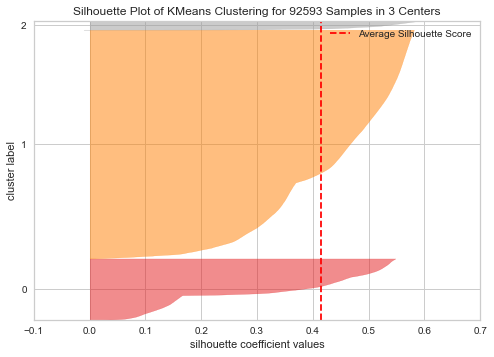

In [38]:
# Instanciation du visualizer 
visualizer = SilhouetteVisualizer(kmeans_3)
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();

In [39]:
# On ré entraine avec K=5
kmeans_5 = KMeans(n_clusters=5)
kmeans_5.fit(X_scaled)
rfm_rs['Cluster'] = kmeans_5.labels_ #Label du cluster associé à chaque point
rfm_rs

,customer_unique_id,Recency,Frequency,Monetary,Review Score,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,5.0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4.0,0
2,0000f46a3911fa3c0805444483337064,537,1,86.22,3.0,4
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,4.0,4
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,5.0,4
...,...,...,...,...,...,...
92588,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,5.0,3
92589,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,4.0,4
92590,ffff371b4d645b6ecea244b27531430a,568,1,112.46,5.0,4
92591,ffff5962728ec6157033ef9805bacc48,119,1,133.69,5.0,0


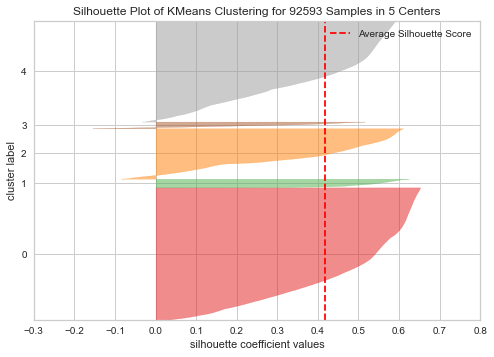

In [40]:
# Instanciation du visualizer 
visualizer = SilhouetteVisualizer(kmeans_5)
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();

In [41]:
# On ré entraine avec K=6
kmeans_6 = KMeans(n_clusters=6)
kmeans_6.fit(X_scaled)
rfm_rs['Cluster'] = kmeans_6.labels_ #Label du cluster associé à chaque point
rfm_rs

,customer_unique_id,Recency,Frequency,Monetary,Review Score,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,5.0,4
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4.0,4
2,0000f46a3911fa3c0805444483337064,537,1,86.22,3.0,1
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,4.0,1
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,5.0,1
...,...,...,...,...,...,...
92588,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,5.0,5
92589,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,4.0,1
92590,ffff371b4d645b6ecea244b27531430a,568,1,112.46,5.0,1
92591,ffff5962728ec6157033ef9805bacc48,119,1,133.69,5.0,4


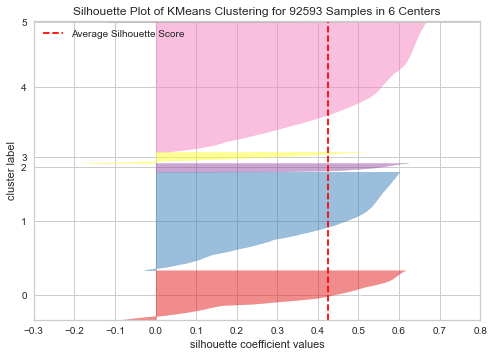

In [42]:
# Instanciation du visualizer 
visualizer = SilhouetteVisualizer(kmeans_6)
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();

### Analyse des clusters pour k = 4

In [43]:
# On ré entraine avec K=4
kmeans_4 = KMeans(n_clusters=4)
kmeans_4.fit(X_scaled)
rfm_rs['Cluster'] = kmeans_4.labels_ #Label du cluster associé à chaque point
rfm_rs

,customer_unique_id,Recency,Frequency,Monetary,Review Score,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,5.0,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4.0,1
2,0000f46a3911fa3c0805444483337064,537,1,86.22,3.0,0
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,4.0,0
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,5.0,0
...,...,...,...,...,...,...
92588,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,5.0,0
92589,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,4.0,0
92590,ffff371b4d645b6ecea244b27531430a,568,1,112.46,5.0,0
92591,ffff5962728ec6157033ef9805bacc48,119,1,133.69,5.0,1


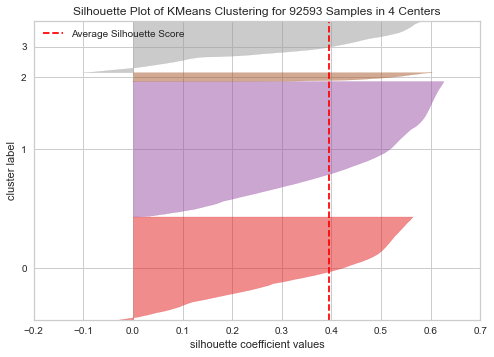

In [44]:
# Instanciation du visualizer 
visualizer = SilhouetteVisualizer(kmeans_4)
visualizer.fit(X_scaled)    # Fit the data to the visualizer
visualizer.poof();

In [45]:
# Pour une meilleure lisibilité, on remplace par des lettres les labels des clusters qui sont par défaut des chiffres.
rfm_rs['Cluster']=rfm_rs['Cluster'].replace(0,'A')
rfm_rs['Cluster']=rfm_rs['Cluster'].replace(1,'B')
rfm_rs['Cluster']=rfm_rs['Cluster'].replace(2,'C')
rfm_rs['Cluster']=rfm_rs['Cluster'].replace(3,'D')
rfm_rs['Cluster'].value_counts(normalize=False).sort_values(ascending=False) # Taille (nombre de clients) par cluster

B    41964
A    32002
D    15903
C     2724
Name: Cluster, dtype: int64

In [46]:
# Représentation 3D des différents clusters de clients selon 3 des 4 axes d'analyse RFM + RS
#fig = px.scatter_3d(rfm_rs, x='Recency', y='Frequency', z='Monetary',color='Cluster')
fig = px.scatter_3d(rfm_rs, x='Recency', y='Review Score', z='Monetary',color='Cluster')
fig.show()

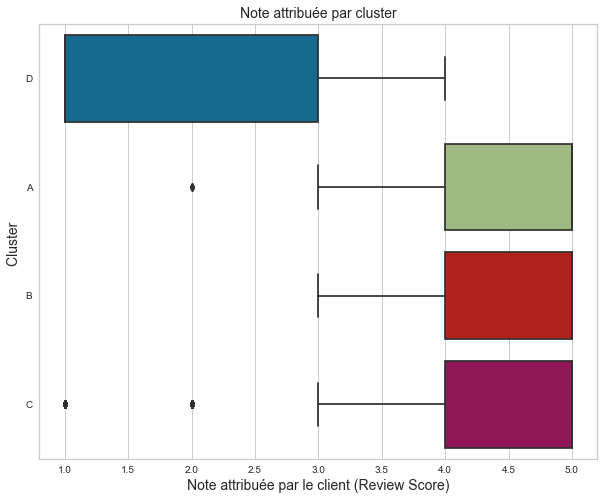

In [47]:
# Boxplot de la note attribuée par le client par cluster
ordre_cluster = rfm_rs.groupby('Cluster')['Review Score'].median().sort_values().index
plt.figure(figsize=(10,8))
plt.title("Note attribuée par cluster", fontsize=14)
sns.boxplot(x=rfm_rs['Review Score'], 
            y=rfm_rs['Cluster'], 
            showfliers=True,
            orient='h', 
            order=ordre_cluster,
            data=rfm_rs)
plt.xlabel('Note attribuée par le client (Review Score)',fontsize=14)
plt.ylabel('Cluster ',fontsize=14)
plt.show()

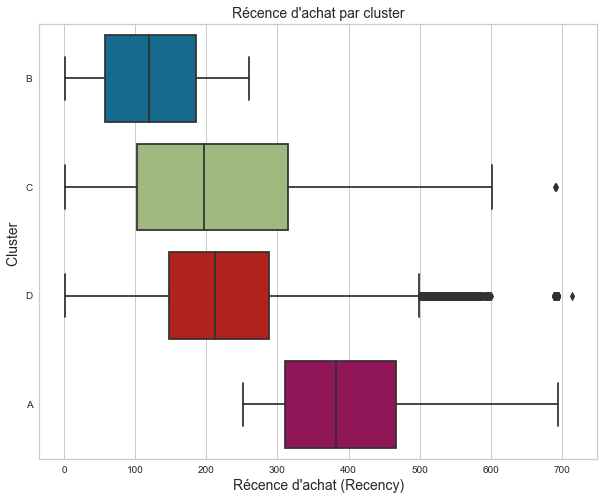

In [48]:
# Boxplot de la Récence par cluster
ordre_cluster = rfm_rs.groupby('Cluster')['Recency'].median().sort_values().index
plt.figure(figsize=(10,8))
plt.title("Récence d'achat par cluster", fontsize=14)
sns.boxplot(x=rfm_rs['Recency'], 
            y=rfm_rs['Cluster'], 
            showfliers=True,
            orient='h', 
            order=ordre_cluster,
            data=rfm_rs)
plt.xlabel("Récence d'achat (Recency)",fontsize=14)
plt.ylabel('Cluster ',fontsize=14)
plt.show()

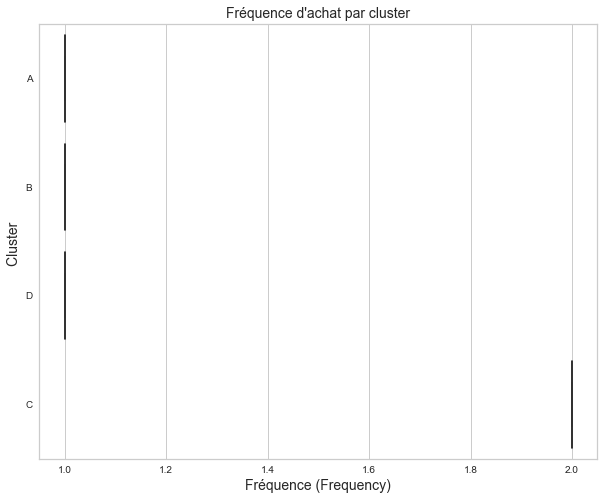

In [49]:
# Boxplot de la Fréquence par cluster
ordre_cluster = rfm_rs.groupby('Cluster')['Frequency'].median().sort_values().index
plt.figure(figsize=(10,8))
plt.title("Fréquence d'achat par cluster", fontsize=14)
sns.boxplot(x=rfm_rs['Frequency'], 
            y=rfm_rs['Cluster'], 
            showfliers=False,
            orient='h', 
            order=ordre_cluster,
            data=rfm_rs)
plt.xlabel('Fréquence (Frequency)',fontsize=14)
plt.ylabel('Cluster ',fontsize=14)
plt.show()

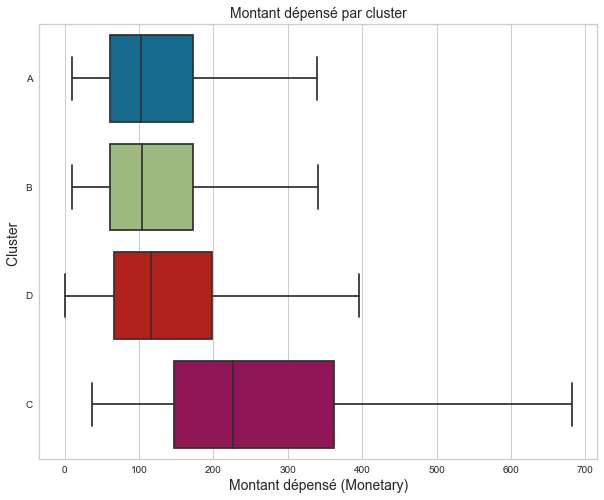

In [50]:
# Boxplot du Montant dépensé par cluster

ordre_cluster = rfm_rs.groupby('Cluster')['Monetary'].median().sort_values().index
plt.figure(figsize=(10,8))
plt.title("Montant dépensé par cluster", fontsize=14)
sns.boxplot(x=rfm_rs['Monetary'], 
            y=rfm_rs['Cluster'], 
            showfliers=False,
            orient='h', 
            order=ordre_cluster,
            data=rfm_rs)
plt.xlabel('Montant dépensé (Monetary)',fontsize=14)
plt.ylabel('Cluster ',fontsize=14)
plt.show()

### Diagrammes Radar

In [51]:
# Agrégation des features par cluster en prenant la médiane
radar=rfm_rs.groupby('Cluster').median()
radar

,Recency,Frequency,Monetary,Review Score
Cluster,,,,
A,383.0,1.0,102.230,5.0
B,120.0,1.0,103.715,5.0
C,197.0,2.0,226.535,5.0
D,212.0,1.0,116.360,1.0


In [52]:
radar.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4 entries, A to D
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Recency       4 non-null      float64
 1   Frequency     4 non-null      float64
 2   Monetary      4 non-null      float64
 3   Review Score  4 non-null      float64
dtypes: float64(4)
memory usage: 160.0+ bytes


In [53]:
# Normalisation des données pour pouvoir les représenter sur le même diagramme
maxAbsScaler = preprocessing.MaxAbsScaler()
radar_scaled=maxAbsScaler.fit_transform(radar)
radar_scaled


array([[1.        , 0.5       , 0.45127684, 1.        ],
       [0.31331593, 0.5       , 0.45783212, 1.        ],
       [0.51436031, 1.        , 1.        , 1.        ],
       [0.5535248 , 0.5       , 0.51365131, 0.2       ]])

In [54]:
# Diagramme Radar représentant la médiane des 4 features d'analyse ( RFM + Review score) pour chaque cluster

categories = rfm_rs.select_dtypes(exclude='object').columns
# coordonnées de chaque "pointe" du diagramme
rA=radar_scaled[0,:]
rB=radar_scaled[1,:]
rC=radar_scaled[2,:]
rD=radar_scaled[3,:]


fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=rA,
      theta=categories,
      fill='toself',
      name='Cluster A'
))


fig.add_trace(go.Scatterpolar(
      r=rB,
      theta=categories,
      fill='toself',
      name='Cluster B'
))

fig.add_trace(go.Scatterpolar(
      r=rC,
      theta=categories,
      fill='toself',
      name='Cluster C'
))

fig.add_trace(go.Scatterpolar(
      r=rD,
      theta=categories,
      fill='toself',
      name='Cluster D'
))

fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, 1])),
    showlegend=True
)

fig.show()

### Analyse ACP
Essai de réduction de dimension avec ACP

In [55]:
#Lecture et affichage du fichier 'olist_model_2'
rfm_rs=pd.read_csv('olist_model_2.csv')
rfm_rs

,customer_unique_id,Recency,Frequency,Monetary,Review Score
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,5.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4.0
2,0000f46a3911fa3c0805444483337064,537,1,86.22,3.0
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,4.0
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,5.0
...,...,...,...,...,...
92588,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,5.0
92589,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,4.0
92590,ffff371b4d645b6ecea244b27531430a,568,1,112.46,5.0
92591,ffff5962728ec6157033ef9805bacc48,119,1,133.69,5.0


In [56]:
# Séparation et standardisation des données
X = rfm_rs.drop(columns='customer_unique_id')
std_scale = preprocessing.StandardScaler()
X_scaled=std_scale.fit_transform(X)

In [57]:
pca=PCA(n_components=4)
pca.fit(X_scaled)
print (pca.explained_variance_ratio_.cumsum())
X_trans=pca.transform(X_scaled)

[0.28253923 0.53637546 0.78295376 1.        ]


Les 2 premières composantes expliques 53.6% de la variance.

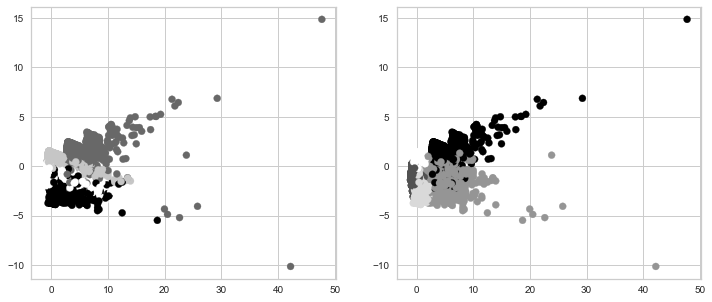

In [58]:
# Représentation du clustering sur les 2 premières composantes

fig=plt.figure(figsize=(12,5))

cls_4=KMeans(n_clusters=4)
cls_4.fit(X_scaled)
ax=fig.add_subplot(121)
ax.scatter(X_trans[:,0],X_trans[:,1],c=cls_4.labels_)

cls_5=KMeans(n_clusters=5)
cls_5.fit(X_scaled)
ax=fig.add_subplot(122)
ax.scatter(X_trans[:,0],X_trans[:,1],c=cls_5.labels_)

In [59]:
# Utilisation de la focntion défnie dans le TP associé au cours Analyse exploratoire de données

def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[0, i],  
                pca.components_[1, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[0, i] + 0.05,
                pca.components_[1, i] + 0.05,
                features[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    # J'ai copié collé le code sans le lire
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

In [60]:
features = rfm_rs.select_dtypes(exclude='object').columns
features

Index(['Recency', 'Frequency', 'Monetary', 'Review Score'], dtype='object')

In [61]:
pcs = pca.components_
pcs = pd.DataFrame(pcs)
pcs.columns = features

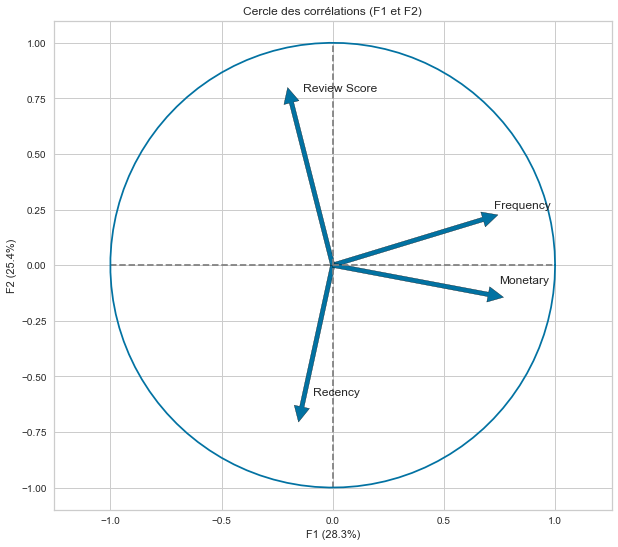

In [62]:
# Cercle des corrélations des composantes F1 et F2
x_y = (0,1)
correlation_graph(pca, x_y, features)

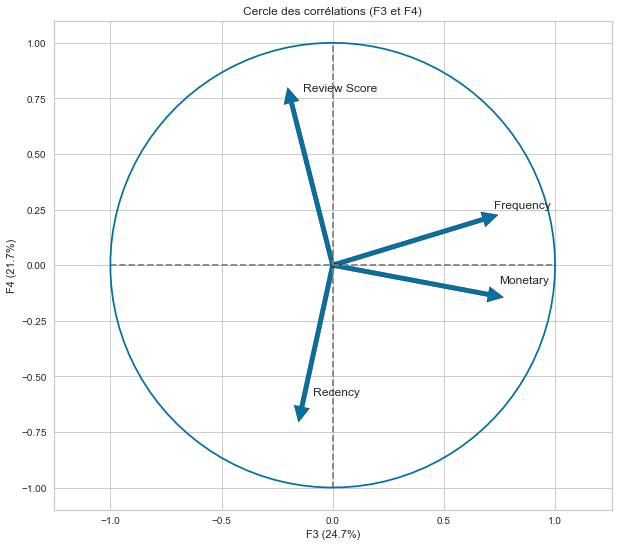

In [63]:
# Cercle des corrélations des composantes F3 et F4
x_y = (2,3)
correlation_graph(pca, x_y, features)

# <a name="C3">3. DBSCAN</a>
## Fetaures RFM

In [64]:
#Lecture et affichage du fichier 'olist_model_1'
rfm=pd.read_csv('olist_model_1.csv')
rfm

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89
...,...,...,...,...
93353,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42
93354,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58
93355,ffff371b4d645b6ecea244b27531430a,568,1,112.46
93356,ffff5962728ec6157033ef9805bacc48,119,1,133.69


In [65]:
# Séparation et Standardisation des données
X = rfm.drop(columns='customer_unique_id')
std_scale = preprocessing.StandardScaler()
X_scaled=std_scale.fit_transform(X)

## DBSCAN : simulation avec min_sample = 100
Recherche de la meilleure valeur pour l'hyperparamètre epsilon

In [66]:
nb_of_clusters=[] #Estimated number of clusters
nb_of_noise_points=[] # Estimated number of noise points
silhouettes=[] # coefficients silhouette

eps_list=[0.1,0.3,0.5,0.7,0.9]

for eps in eps_list:
    db = DBSCAN(eps=eps, min_samples=100).fit(X_scaled)
    labels = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    nb_of_clusters.append(n_clusters_)
    nb_of_noise_points.append(n_noise_)
    #silhouettes.append(metrics.silhouette_score(X_scaled, labels))
    print("epsilon : %f " %eps)
    print("Estimated number of clusters: %d" % n_clusters_)
    print("Estimated number of noise points: %d" % n_noise_)
    #print(f"Silhouette Coefficient: {metrics.silhouette_score(X_scaled, labels):.3f}")

epsilon : 0.100000 
Estimated number of clusters: 3
Estimated number of noise points: 10402
epsilon : 0.300000 
Estimated number of clusters: 3
Estimated number of noise points: 2636
epsilon : 0.500000 
Estimated number of clusters: 3
Estimated number of noise points: 1280
epsilon : 0.700000 
Estimated number of clusters: 2
Estimated number of noise points: 758
epsilon : 0.900000 
Estimated number of clusters: 2
Estimated number of noise points: 595


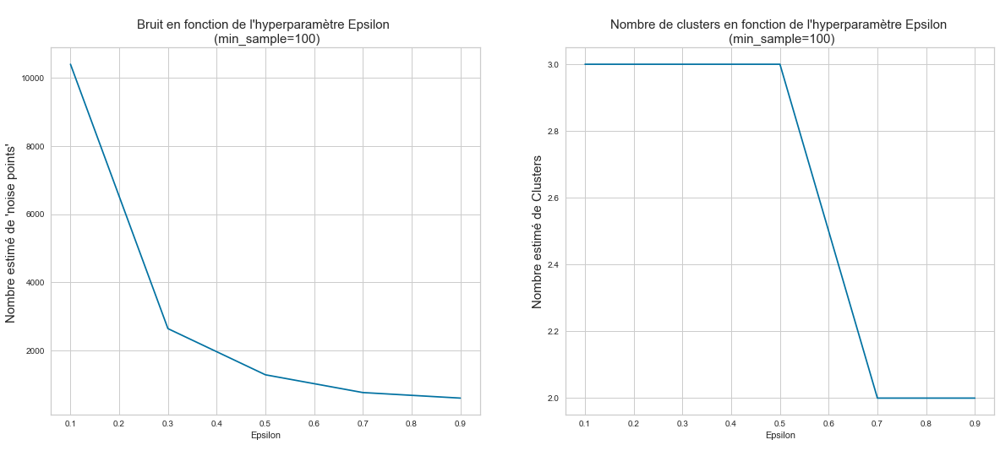

In [67]:
fig=plt.figure(figsize = (20,8))


# Nombre estimé de noise points en fonction des valeurs prises par epsilon
ax = fig.add_subplot(1,2,1)
ax.set_ylabel("Nombre estimé de 'noise points' ",fontsize=15)
ax.set_xlabel("Epsilon")
ax = plt.plot(eps_list, nb_of_noise_points)
plt.title("Bruit en fonction de l'hyperparamètre Epsilon \n (min_sample=100)", fontsize=15)

# Nombre estimé de clusters en fonction des valeurs prises par epsilon
ax = fig.add_subplot(1,2,2)
ax.set_ylabel("Nombre estimé de Clusters",fontsize=15)
ax.set_xlabel("Epsilon\n")
ax = plt.plot(eps_list, nb_of_clusters)
plt.title("\nNombre de clusters en fonction de l'hyperparamètre Epsilon \n (min_sample=100)", fontsize=15);



# Coefficients de silhouette en fonction des valeurs prises par epsilon
#ax = fig.add_subplot(2,2,3)
#ax.set_ylabel("Coefficient de Silhouette")
#ax.set_xlabel("Epsilon")
#ax = plt.plot(eps_list, silhouettes)

### Test du DBSCAN pour min_sample = 100 et epsilon = 0.5

In [68]:
# Fit DBSCAN with eps = 0.5
db = DBSCAN(eps=0.5, min_samples=100).fit(X_scaled)
# Create a new column on the original dataframe called "Labels" consisting of the DBSCAN labels.
rfm['Cluster'] = db.labels_
rfm

,customer_unique_id,Recency,Frequency,Monetary,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,0
2,0000f46a3911fa3c0805444483337064,537,1,86.22,0
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,0
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,0
...,...,...,...,...,...
93353,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,-1
93354,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,0
93355,ffff371b4d645b6ecea244b27531430a,568,1,112.46,0
93356,ffff5962728ec6157033ef9805bacc48,119,1,133.69,0


In [69]:
# Pour une meilleure lisibilité, remplacement par une lettre des labels des clusters
rfm['Cluster']=rfm['Cluster'].replace(0,'A')
rfm['Cluster']=rfm['Cluster'].replace(1,'B')
rfm['Cluster']=rfm['Cluster'].replace(2,'C')
rfm['Cluster']=rfm['Cluster'].replace(3,'D')
rfm['Cluster']=rfm['Cluster'].replace(-1,'Noise')
rfm['Cluster'].value_counts(normalize=False).sort_values(ascending=False)


A        89518
C         2342
Noise     1280
B          218
Name: Cluster, dtype: int64

In [70]:
# Représentation 3D des différents clusters de clients selon les 3 axes d'analyse RFM
fig = px.scatter_3d(rfm, x='Recency', y='Frequency', z='Monetary',color='Cluster')

fig.show()

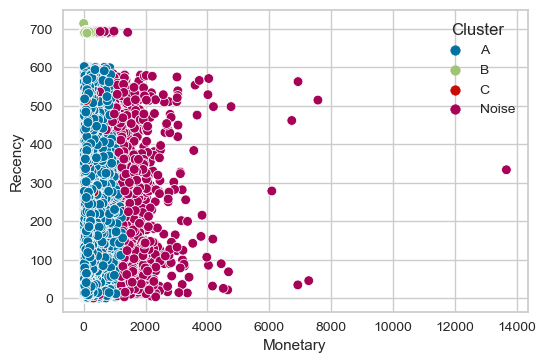

In [71]:
# plot the result 
plt.figure(figsize = (6,4), dpi = 100)
sns.scatterplot(data=rfm,x='Monetary',y='Recency',hue='Cluster')
plt.show()

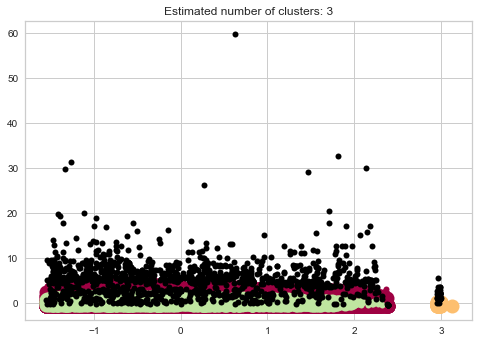

In [72]:
labels=db.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

unique_labels = set(labels)
core_samples_mask = np.zeros_like(labels, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True

colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = labels == k

    xy = X_scaled[class_member_mask & core_samples_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 2],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=14,
    )

    xy = X_scaled[class_member_mask & ~core_samples_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 2],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )

plt.title(f"Estimated number of clusters: {n_clusters_}")
plt.show()

## DBSCAN : simulation avec min_sample = 10

In [73]:
nb_of_clusters=[] #Estimated number of clusters
nb_of_noise_points=[] # Estimated number of noise points
silhouettes=[]

eps_list=[0.1,0.3,0.5,0.7,0.9]

for eps in eps_list:
    db = DBSCAN(eps=eps, min_samples=10).fit(X_scaled)
    labels = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    nb_of_clusters.append(n_clusters_)
    nb_of_noise_points.append(n_noise_)
    #silhouettes.append(metrics.silhouette_score(X_scaled, labels))
    print("epsilon : %f " %eps)
    print("Estimated number of clusters: %d" % n_clusters_)
    print("Estimated number of noise points: %d" % n_noise_)
    #print(f"Silhouette Coefficient: {metrics.silhouette_score(X_scaled, labels):.3f}")

epsilon : 0.100000 
Estimated number of clusters: 31
Estimated number of noise points: 2187
epsilon : 0.300000 
Estimated number of clusters: 8
Estimated number of noise points: 514
epsilon : 0.500000 
Estimated number of clusters: 6
Estimated number of noise points: 238
epsilon : 0.700000 
Estimated number of clusters: 4
Estimated number of noise points: 154
epsilon : 0.900000 
Estimated number of clusters: 5
Estimated number of noise points: 94


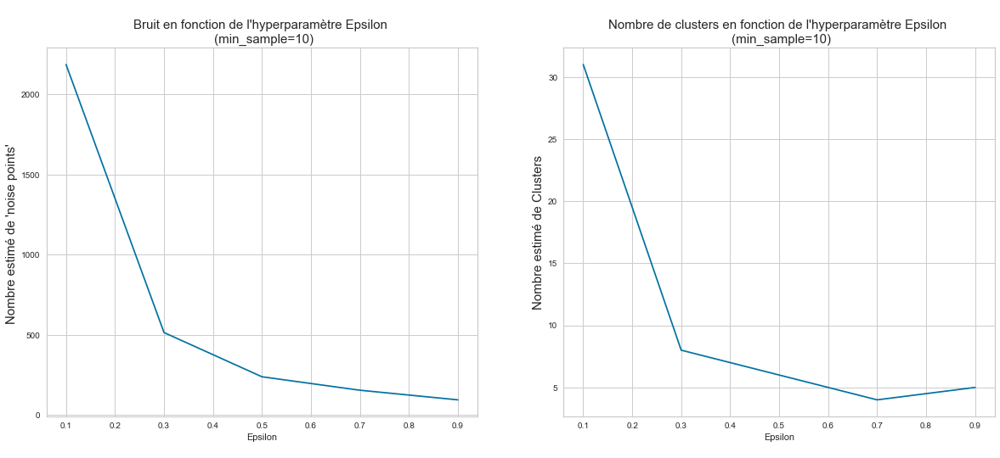

In [74]:
fig=plt.figure(figsize = (20,8))


# Nombre estimé de noise points en fonction des valeurs prises par epsilon
ax = fig.add_subplot(1,2,1)
ax.set_ylabel("Nombre estimé de 'noise points' ",fontsize=15)
ax.set_xlabel("Epsilon")
ax = plt.plot(eps_list, nb_of_noise_points)
plt.title("Bruit en fonction de l'hyperparamètre Epsilon \n (min_sample=10)", fontsize=15)

# Nombre estimé de clusters en fonction des valeurs prises par epsilon
ax = fig.add_subplot(1,2,2)
ax.set_ylabel("Nombre estimé de Clusters",fontsize=15)
ax.set_xlabel("Epsilon\n")
ax = plt.plot(eps_list, nb_of_clusters)
plt.title("\nNombre de clusters en fonction de l'hyperparamètre Epsilon \n (min_sample=10)", fontsize=15);



# Coefficients de silhouette en fonction des valeurs prises par epsilon
#ax = fig.add_subplot(2,2,3)
#ax.set_ylabel("Coefficient de Silhouette")
#ax.set_xlabel("Epsilon")
#ax = plt.plot(eps_list, silhouettes)

### Test du DBSCAN pour min_sample = 10 et epsilon =0.5

In [75]:
# fit DBSCAN with eps = 0.5
db = DBSCAN(eps=0.5, min_samples=10).fit(X_scaled)
# Create a new column on the original dataframe called "Labels" consisting of the DBSCAN labels.
rfm['Cluster'] = db.labels_
rfm

,customer_unique_id,Recency,Frequency,Monetary,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,0
2,0000f46a3911fa3c0805444483337064,537,1,86.22,0
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,0
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,0
...,...,...,...,...,...
93353,fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,0
93354,fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,0
93355,ffff371b4d645b6ecea244b27531430a,568,1,112.46,0
93356,ffff5962728ec6157033ef9805bacc48,119,1,133.69,0


In [76]:
# Pour une meilleure lisibilité, remplacement par une lettre des labels des clusters
rfm['Cluster']=rfm['Cluster'].replace(0,'A')
rfm['Cluster']=rfm['Cluster'].replace(1,'B')
rfm['Cluster']=rfm['Cluster'].replace(2,'C')
rfm['Cluster']=rfm['Cluster'].replace(3,'D')
rfm['Cluster']=rfm['Cluster'].replace(4,'E')
rfm['Cluster']=rfm['Cluster'].replace(5,'F')
rfm['Cluster']=rfm['Cluster'].replace(6,'G')
rfm['Cluster']=rfm['Cluster'].replace(-1,'Noise')
rfm['Cluster'].value_counts(normalize=False).sort_values(ascending=False)

A        90208
C         2507
B          246
Noise      238
D          143
F           10
E            6
Name: Cluster, dtype: int64

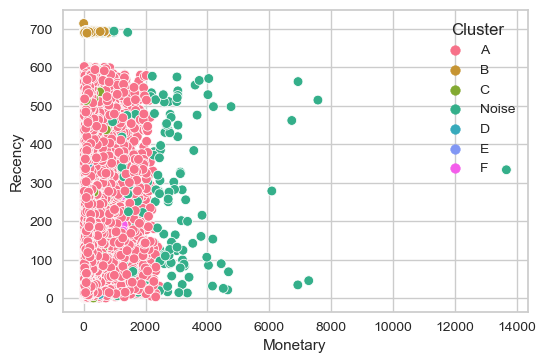

In [77]:
# Réprésentation de la segmentation du DBSCAN sur les 2 axes Recency et Monetary
plt.figure(figsize = (6,4), dpi = 100)
sns.scatterplot(data=rfm,x='Monetary',y='Recency',hue='Cluster')
plt.show()

La simulation pour le contrat de maintenance est réalisée dans un notebook séparé.